# Shnogh HEP - Setup Basemaps

## description of procedure

The Setup Baseamp procedure reads in a DXF file from CAD, which must contain topography as either a TIN, contours or points.

Expected outputs of Setup Basemaps procedure:
* DEM raster suitable for waterways DSS alignment interrogation 
* terrain relief map 
* hillslope map
* project layout map
* hydrologic map with watersheds and watercourses
* satellite DEM map for cross-checking project topography
* reporting of topographic inputs, outputs, differences between topographic inputs and processing

Required inputs for Setup Basemaps procedure:
* CAD DWG with topography as  (contours, TIN or points) as ./data/in
* CAD topography as DXF (contours, TIN or points) using e.g. Sketchup as ./data/in
* project layout (PDF) as ./data/in
* project name (which corresponds to project folder) as Jupyter inout
* project coordinate system (or assumption as e.g. pseudo Mercator) as Jupyter input
* coordinate bounds (grass region), typically same as bound of suitably cropped project layout, as Jupyter input
* layer(s) with topographic data -> by querying of imported DXF, as Jupyter input
* layer(s) with stream data -> by querying of imported DXF, as Jupyter input
* project layout (PNG) suitably cropped and rotated such that north is y-axis of layout as ./data/in

Using procedure in a Jupyter Notebook Basemap template:
1. call grass setup from API
2. define basic input data
3. report basic input data
4. add required input data from report (e.g. layers with topographic data)
5. call Setup Basemaps procedure from API
6. display Basemaps
7. report for Basemaps
8. export Basemaps as PNG (e.g. for Google Maps, plotly)

Output grass raster layers:
* 'project'/grassdata/Permeanent/cells/terrain_dem
* 'project'/grassdata/Permeanent/cells/terrain_relief
* 'project'/grassdata/Permeanent/cells/terrain_hillslope
* 'project'/grassdata/Permeanent/cells/terrain_hydrology
* 'project'/grassdata/Permeanent/cells/rpoject_layout

Output grass raster tiff data files:
 * to be added


Output grass image png data files:
* 'project'/data/out/image/*.png



## grass setup

In [1]:
# import Basemap API
from basemap import *
from basemap import Basemap

## project setup

In [2]:
# define required user input data for project
project = 'ShnoghHEP'
crs = 'EPSG:3857'  #WGS84 Pseudo Mercator
n,s,e,w = 4559000,4536000,8484000,8463000  #project coordinate bounds from data inspection
res = 10  #sets raster resolution

In [3]:
# instantiate Basemap instance
map = Basemap(project)

project: ShnoghHEP

 
basemapy.py - Basemap Module
    prepares a set of raster basemaps for a project
       basemaps are suitable for geospatial querying from alignments
       basemaps are suitable for importing as layers into qgis

Usage:
    1. map = Basemap(project)                              instantiate a project basemap
    2. map.inspect_dxf(project_dir, topogDXF)              examine DXF data containing topography
    3. map.import_dxf(project_dir, topogDXF, layers_dxf)   import DXF data layer containing topography
    4. map.rasterize_vect_lines                            rasterize vector data - sparse data, irregular bounds
       OR map.rasterize_vect_faces                                               - dense date, regular bounds
       OR map.rasterize_vect_using_points                                        - sparse data, regular bounds
    5. map.hillslope()                                     create a hillslope raster map
    6. map.relief_map()                     

In [4]:
# define required input data files for project
topogDXF = 'data/in/DMI-2D_cleaned.dxf'
##layoutPDF = 'data/in/SHN-000-GE-DR-010-A0.pdf'
##layoutPDF = 'data/in/Screenshot_r_c.png'
layoutPDF = 'data/in/images/ShnogHEP.WaterwaysAtlernative-5_r_c.png'

In [5]:
# open mapset for project (create mapset if it doesn't exist)
mapset_loc, rcfile = map.grass_mapset(crs)

grass -c EPSG:3857 -e /home/kaelin_joseph/projects/ShnoghHEP//grassdata/ShnoghHEP
The location ShnoghHEP already exists


In [6]:
# set grass region for project
g.region(n=n,s=s,e=e,w=w, res=res)

Module('g.region')

In [7]:
# report grass setup
print('\n' 'grass environment:')
print(grass.gisenv())

# report grass coordinate system
print('\n' 'coordinate system:')
print(map.read_grass('g.proj', flags = 'jf'))

# report grass region
print('\n' 'grass mapset region:')
print(g.region(flags='p',stdout_=PIPE).outputs.stdout.decode())


grass environment:
{'MAPSET': 'PERMANENT', 'GISDBASE': '/home/kaelin_joseph/projects/ShnoghHEP//grassdata', 'LOCATION_NAME': 'ShnoghHEP'}

coordinate system:
('+proj=merc +lat_ts=0.0 +lon_0=0.0 +x_0=0.0 +y_0=0 +k=1.0 +no_defs +a=6378137 +rf=298.257223563 +towgs84=0.000,0.000,0.000 +to_meter=1\n', '')

grass mapset region:
projection: 99 (Mercator)
zone:       0
datum:      wgs84
ellipsoid:  wgs84
north:      4559000
south:      4536000
west:       8463000
east:       8484000
nsres:      10
ewres:      10
rows:       2300
cols:       2100
cells:      4830000



## read in DXF data file containing topogaphy

In [8]:
# inspect layers in DXF data file to be read in
map.inspect_dxf(topogDXF)

Layer 1: kadr
Layer 2: dimension
Layer 3: 0
Layer 4: title
Layer 5: c-topo-majr
Layer 6: c-road-prof-grid-majr
Layer 7: c-road-prof-ttlb
Layer 8: c-road-prof-text @ 29.94
Layer 9: _ewe perfil de terreno
Layer 10: text @ 29.94
Layer 11: maj
Layer 12: maj @ 20
Layer 13: river-maj
Layer 14: city
Layer 15: text
Layer 16: 0 @ 29.94



In [9]:
# import topography data from DXF data file 
# define layers to be used to extract topography
layers_dxf = 'maj'  #'maj @ 20,maj'

map.import_dxf(topogDXF, layers_dxf, dbg=0)


import_dxf completed


In [10]:
# report of imported DXF layers
print(map.read_grass("v.info", map='topog_vect', layer=layers_dxf)[0].decode()) 

# report entities in  imported DXF layers
out = map.read_grass("v.db.select", map='topog_vect')[0].splitlines()
for line in range(0,5):
    print(out[line])

 +----------------------------------------------------------------------------+
 | Name:            topog_vect                                                |
 | Mapset:          PERMANENT                                                 |
 | Location:        ShnoghHEP                                                 |
 | Database:        /home/kaelin_joseph/projects/ShnoghHEP//grassdata         |
 | Title:           topog_vect                                                |
 | Map scale:       1:2400                                                    |
 | Name of creator: kaelin_joseph                                             |
 | Organization:    GRASS Development Team                                    |
 | Source date:                                                               |
 | Timestamp (first layer): none                                              |
 |----------------------------------------------------------------------------|
 | Map format:      native              

In [11]:
# import stream data from DXF data file 
# this is considered a one-off for the Shnogh HEP project and is not implemented int he API
map.read_grass("v.in.dxf", input=topogDXF, layers='river-maj',  
             output='streams')[0]

''

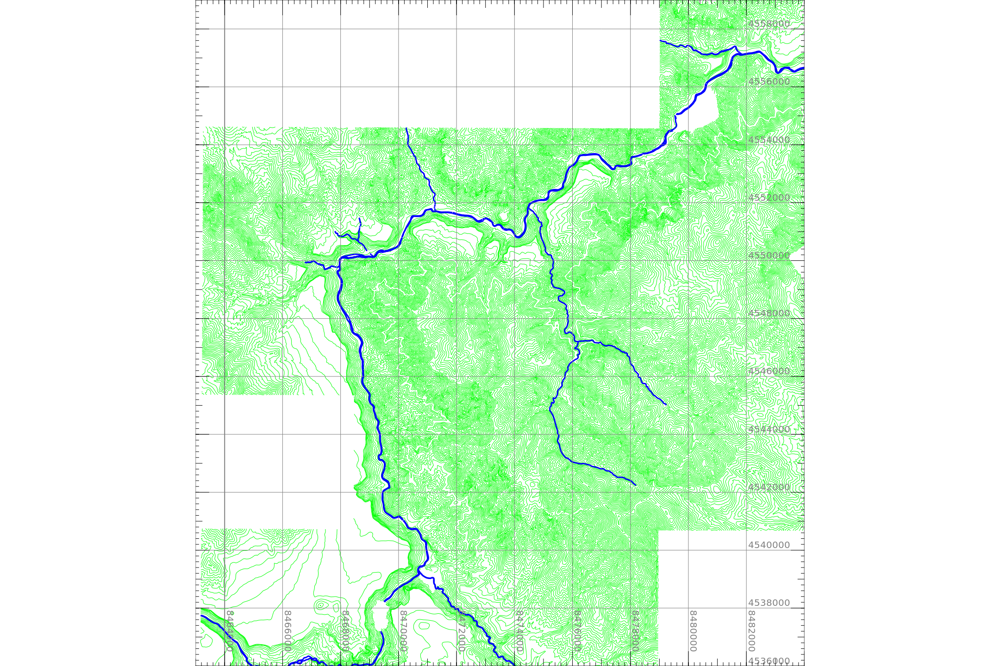

In [12]:
# display topography vector data
output_image = 'data/out/images/topog_vect.png'
os.environ['GRASS_RENDER_FILE'] = output_image
map.read_grass("d.mon", start='cairo', resolution=2, width=1080, height=720, overwrite=True)
map.read_grass("d.vect", map='topog_vect', color='green')

# show streams imported from dxf
map.read_grass('d.vect', map='streams', type='line', color='blue', width=3)

# show grid and display result
map.read_grass("d.grid", size=2000, fontsize=20)[0]
Image(filename = output_image)

## convert vector data with DXF topography to raster DEM

In [13]:
# convert vector DXF data to raster DEM
# testing
map.rasterize_vect_lines(dbg=1)            # OK
#map.rasterize_vect_faces(dbg=1)           # ~OK
#map.rasterize_vect_using_points(dbg=1)    # NG - no clipping

Reading features...
   2   5   8  11  14  17  20  23  26  29  32  35  38  41  44  47  50  53  56  59  62  65  68  71  74  77  80  83  86  89  92  95  98 100
Writing raster map...
   0   3   6   9  12  15  18  21  24  27  30  33  36  39  42  45  48  51  54  57  60  63  66  69  72  75  78  81  84  87  90  93  96  99 100
Converted points/lines: 1070 of 1070
v.to.rast complete.

Processing all selected output files will require
18.42 MB of disk space for temp files.
Temporarily changing the region to desired resolution ...
Changing back to the original region ...
Percent complete:
   0   2   4   6   8  10  12  14  16  18  20  22  24  26  28  30  32  34  36  38  40  42  44  46  48  50  52  54  56  58  60  62  64  66  68  70  72  74  76  78  80  82  84  86  88  90  92  94  96  98 100
dnorm in ressegm after grid before out2= 124.899960 
dnorm in mainc after grid before out1= 124.899960
dnorm in mainc after grid before out2= 124.899960
r.resamp.rst complete.

rasterize_vect_lines completed


In [14]:
# report of raster DEM
print(map.read_grass("r.report", map='topog_rast_resamp', units='h,p', nsteps=10)[0].decode()) 
print(map.read_grass("r.report", map='topog_rast_resamp', units='h,p', nsteps=10)[0].decode()) 
print(map.read_grass("r.univar", map='topog_rast_resamp')[0].decode()) 

+-----------------------------------------------------------------------------+
|                         RASTER MAP CATEGORY REPORT                          |
|LOCATION: ShnoghHEP                                  Wed Aug 29 07:05:16 2018|
|-----------------------------------------------------------------------------|
|          north: 4559000    east: 8484000                                    |
|REGION    south: 4536000    west: 8463000                                    |
|          res:        10    res:       10                                    |
|-----------------------------------------------------------------------------|
|MASK: none                                                                   |
|-----------------------------------------------------------------------------|
|MAP: (untitled) (topog_rast_resamp in PERMANENT)                             |
|-----------------------------------------------------------------------------|
|                   Category Information

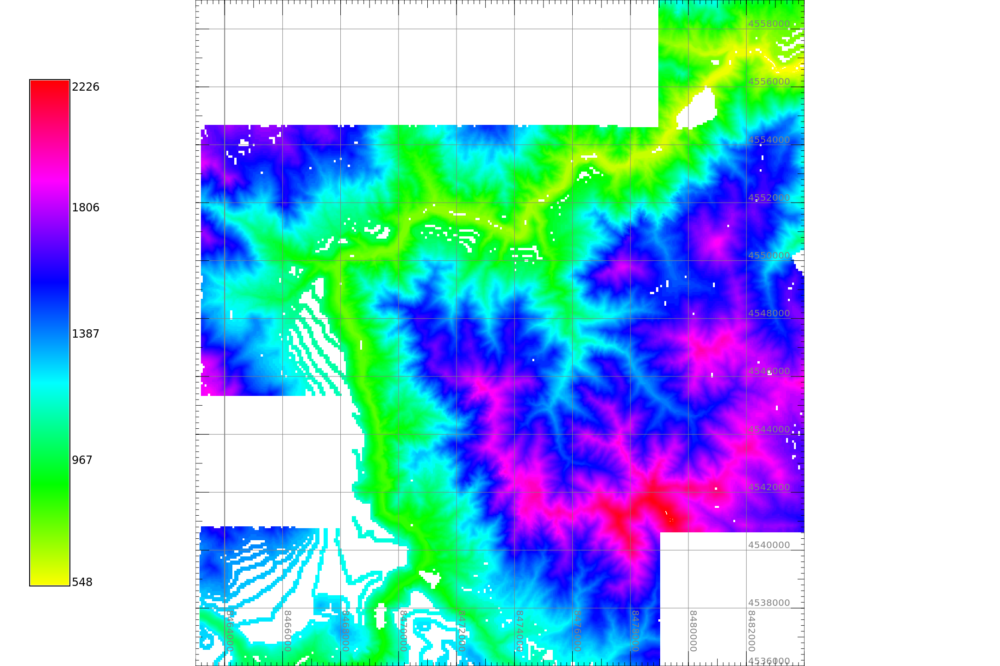

In [15]:
# display topography raster DEM
map.read_grass("d.mon", select='cairo', flags='r')  #release current display monitor
output_image = 'data/out/images/topog_rast.png'
os.environ['GRASS_RENDER_FILE'] = output_image
map.read_grass("d.mon", start='cairo', resolution=2, width=1080, height=720, overwrite=True)
map.read_grass("d.rast", map='topog_rast_resamp', bgcolor='white', flags='n')
map.read_grass("d.legend", raster='topog_rast_resamp', fontsize='24')[1]
# show grid and display result
map.read_grass("d.grid", size=2000, fontsize=20)[0]
Image(filename = output_image)

## hillslope map

In [16]:
# create a hillslope raster map from raster DEM
map.hillslope()


hillslope completed


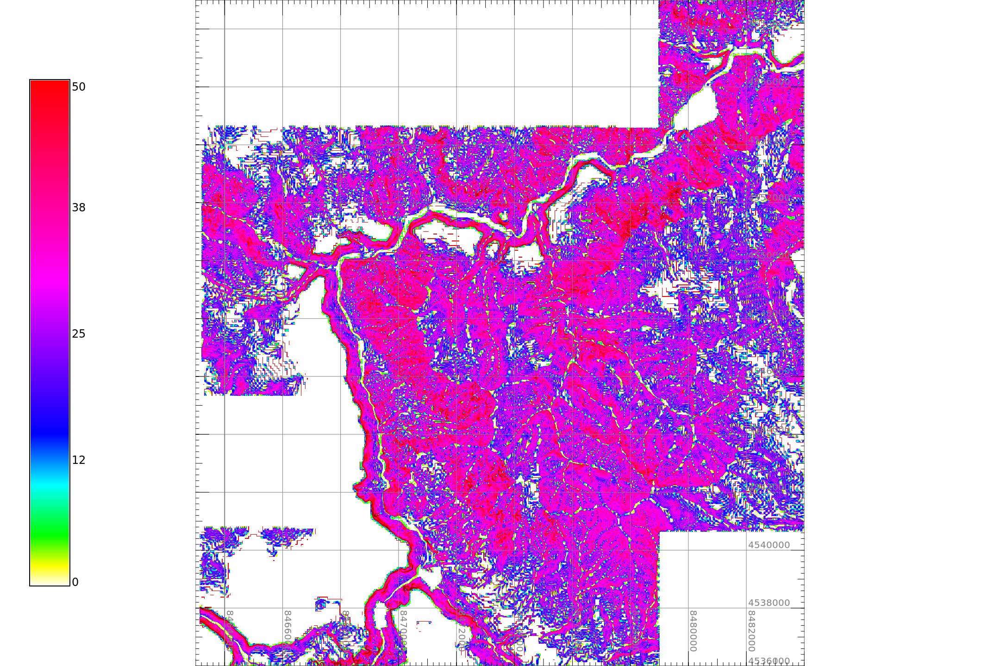

In [17]:
# display hillslope map 
map.read_grass("d.mon", select='cairo', flags='r')  #release current display monitor
output_image = 'data/out/images/topog_slope.png'
os.environ['GRASS_RENDER_FILE'] = output_image
map.read_grass("d.mon", start='cairo', resolution=2, width=1080, height=720, overwrite=True)
map.read_grass("d.rast", map='topog_slope', bgcolor='white', flags='n')
map.read_grass("d.legend", raster='topog_slope', range='0,50', fontsize='24')[1]
# show grid and display result
map.read_grass("d.grid", size=2000, fontsize=20)[0]
Image(filename = output_image)

## shaded relief map

In [18]:
# create an shaded relief map from raster DEM
map.relief_map()



shaded relief map completed


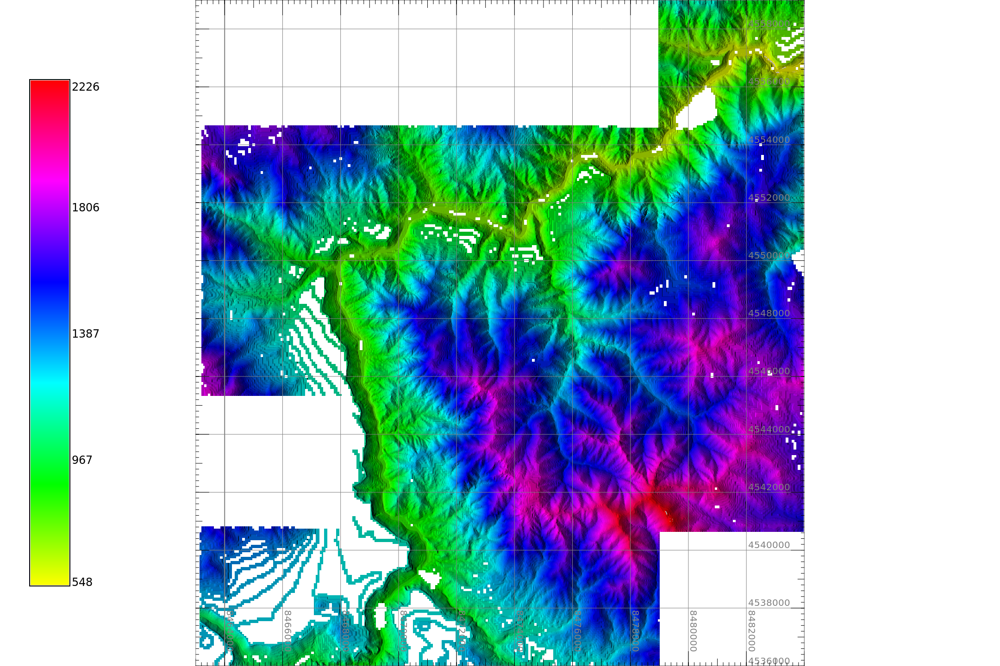

In [19]:
# display shaded relief map 
map.read_grass("d.mon", select='cairo', flags='r')  #release current display monitor
output_image = 'data/out/images/topog_relief.png'
os.environ['GRASS_RENDER_FILE'] = output_image
map.read_grass("d.mon", start='cairo', resolution=2, width=1080, height=720, overwrite=True)
map.read_grass("d.rast", map='topog_relief_color', bgcolor='white', flags='n')
map.read_grass("d.legend", raster='topog_rast_resamp', fontsize='24')[1]
# show grid and display result
map.read_grass("d.grid", size=2000, fontsize=20)[0]
Image(filename = output_image)

## hydrologic map

In [20]:
# create a hydrologic map from raster DEM
map.hydrology_map()







hydrologic map completed


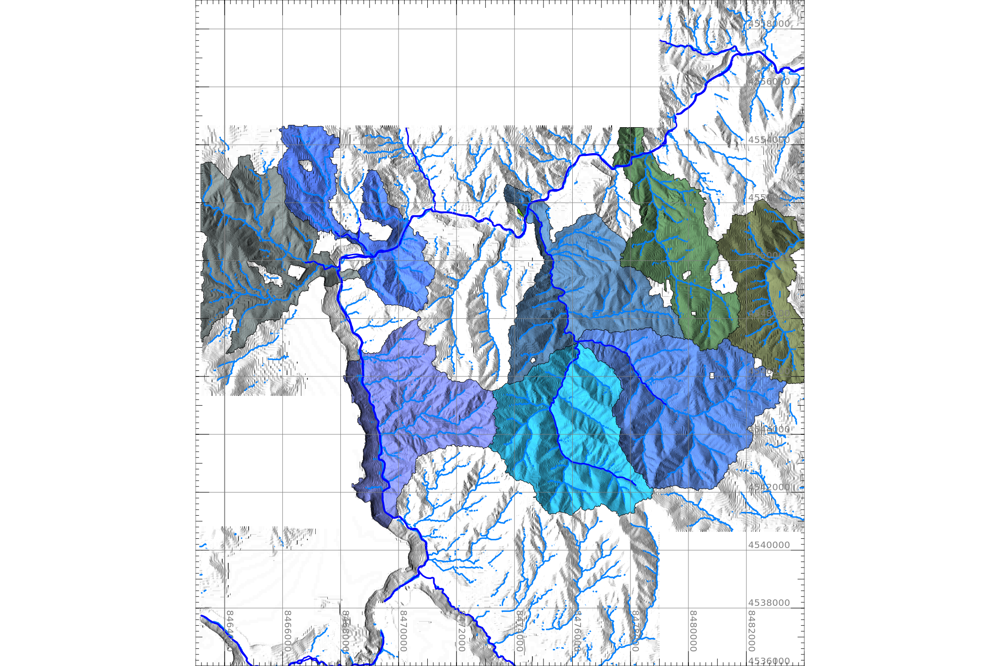

In [21]:
# display hydrologic map 
map.read_grass("d.mon", select='cairo', flags='r')  #release current display monitor
output_image = 'data/out/images/topog_hydrology.png'
os.environ['GRASS_RENDER_FILE'] = output_image
map.read_grass("d.mon", start='cairo', resolution=2, width=1080, height=720, overwrite=True)
# display shaded relief map with watershed basins
map.read_grass('d.his', hue="topog_basin", intensity="topog_relief", brighten="40")[0]
# display watershed basin boundaries
map.read_grass('d.vect', map="topog_basin_vect", type="boundary",  width=1)
# display streams calculated from accumulation
map.read_grass("d.vect", map='topog_accum_vect', verbose=True, bgcolor='white', 
              color='indigo', width=3)[0]
# display streams imported from dxf
map.read_grass('d.vect', map='streams', type='line', color='blue', width=3)
# show grid and display result
map.read_grass("d.grid", size=2000, fontsize=20)[0]
Image(filename = output_image)

## project layout map

In [22]:
# import PNG image with project layout into grass as raster image
map.layout_map(layoutPDF, dbg=0)






layout map completed


In [23]:
# adjust geolocated map position based on visual inspection
map.read_grass("r.region", map='layout_rast_rgb', verbose=True, 
               n='n+200',s='s+200', e='e+100',w='w+100')[0]

''

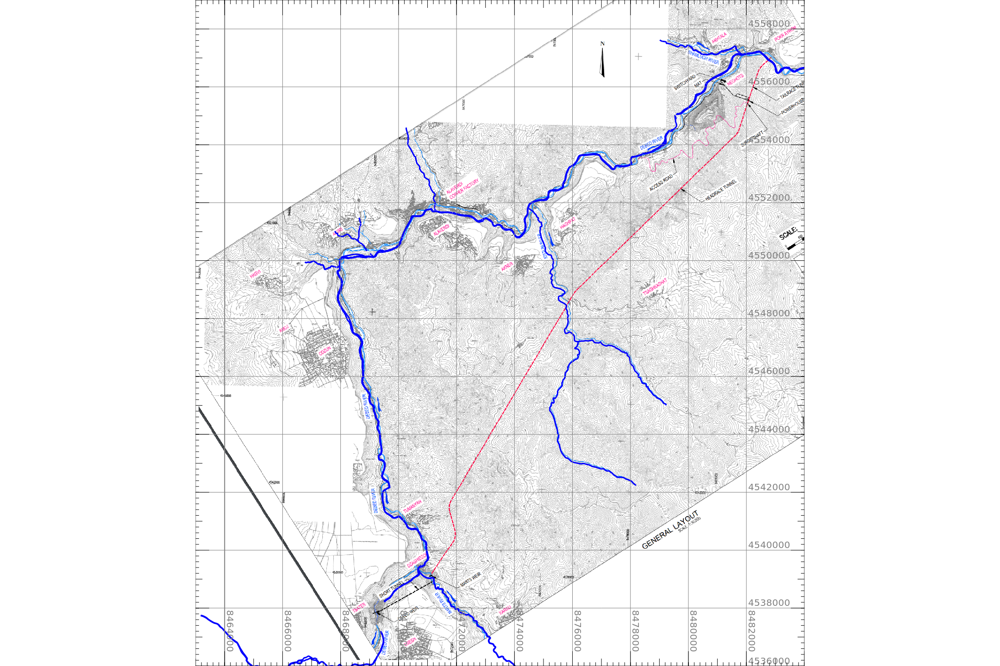

In [24]:
# display project layout map 
map.read_grass("d.mon", select='cairo', flags='r')  #release current display monitor
output_image = 'data/out/images/layout_rast.png'
os.environ['GRASS_RENDER_FILE'] = output_image
map.read_grass("d.mon", start='cairo', resolution=2, width=1080, height=720, overwrite=True)
map.read_grass("d.rast", map='layout_rast_rgb', bgcolor='white', flags='n')
# display streams imported from dxf
map.read_grass('d.vect', map='streams', type='line', color='blue', width=3)
# show grid and display result
map.read_grass("d.grid", size=2000, fontsize=20)[0]
Image(filename = output_image)

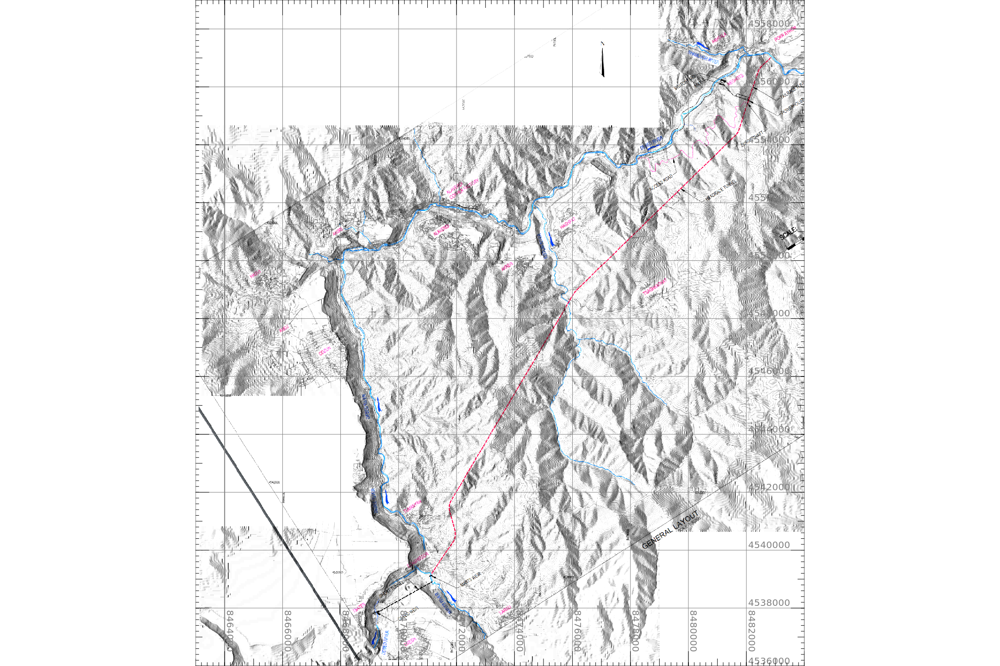

In [25]:
# display hydrologic map 
map.read_grass("d.mon", select='cairo', flags='r')  #release current display monitor
output_image = 'data/out/images/layout_rast2.png'
os.environ['GRASS_RENDER_FILE'] = output_image
map.read_grass("d.mon", start='cairo', resolution=2, width=1080, height=720, overwrite=True)
# display shaded relief map with watershed basins
map.read_grass('d.his', hue="layout_rast_rgb", intensity="topog_relief", brighten="40")[0]
# show grid and display result
map.read_grass("d.grid", size=2000, fontsize=20)[0]
Image(filename = output_image)

## check topography comparing differences between raster results

In [26]:
!r.mapcalc "topog_vect_rast_=(topog_rast_resamp)-(topog_xyz_rast_resamp)"


   0   3   6   9  12  15  18  21  24  27  30  33  36  39  42  45  48  51  54  57  60  63  66  69  72  75  78  81  84  87  90  93  96  99 100


In [27]:
print(map.read_grass("r.univar", map='topog_vect_rast_')[0].decode()) 


total null and non-null cells: 4830000
total null cells: 1543871

Of the non-null cells:
----------------------
n: 3286129
minimum: -81.8671
maximum: 99.9756
range: 181.843
mean: 0.204757
mean of absolute values: 5.96042
standard deviation: 8.62536
variance: 74.3968
variation coefficient: 4212.49 %
sum: 672857.378601074



In [28]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
#map.read_grass("d.rast", map='topog_vect_rast_', verbose=True, bgcolor='white', flags='n',
#             )[0]
map.read_grass("d.rast", map='topog_vect_rast_', verbose=True, bgcolor='white', flags='n',
              values='(-10)-(10)')[0]

rm: cannot remove 'map.png': No such file or directory


''

In [29]:
map.read_grass("d.legend", raster='topog_vect_rast_')[1]
#map.read_grass("d.legend", raster='topog_vect_rast_', range='-10,10')[1]

'WARNING: MONITOR variable defined, GRASS_RENDER_IMMEDIATE ignored\n'

In [30]:
Image(filename="map.png")

IOError: [Errno 2] No such file or directory: u'map.png'

## extract points from vector data from DXF

In [ ]:
#points_out = map.read_grass("v.to.points", input='topog_vect', output='topog_vect_points') 
#print(points_out[1].decode())

#WARNING: 1565094 features without category in layer <1> skipped. Note that
#         features without category (usually boundaries) are not skipped
#         when 'layer=-1' is given.
# without categories --> seems x,y,z are all missing   !!

points_out = map.read_grass("v.to.points", input='topog_vect', layer=-1, output='topog_vect_points') 
print(points_out[1].decode())

# works (output)

In [ ]:
#print(map.read_grass("v.db.select", map='topog_vect_points', layer=-1)[0].decode()) 


# lots of output, apparently one line for each coordinate ??

In [ ]:
print(map.read_grass("v.info", map='topog_vect_points')[0].decode()) 

In [ ]:
map.read_grass("v.out.ascii", input='topog_vect_points', type='point', layer=-1, separator=',',
              output='data/out/topog_vect_points.csv')

# this works (but includes layers with bad data)
# try with only identified layers with correct contour data   !!

In [ ]:
#print(map.read_grass("g.region", vect='topog_vect_points')[1].decode())  # does not help to display image


In [ ]:
# view and check points
!rm map.png                                                                                 #ToDo JK: pythonize
map.read_grass("d.vect", map='topog_vect_points', color='red')

In [ ]:
Image(filename="map.png")

# no image visible   ??
# image is displayed in qgisp

In [ ]:
map.read_grass("v.to.rast", input='topog_vect_points', use='z', layer=-1, 
             output='topog_vect_points_rast')[0]


In [ ]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
map.read_grass("d.rast", map='topog_vect_points_rast')[0]


In [ ]:
Image(filename="map.png")

## extract lines from vector data from DXF

In [ ]:
map.read_grass("v.out.ascii", input='topog_vect', type='line', format='wkt', layer=-1,
              output='data/out/topog_vect_lines.csv')


## convert points to raster data using r.in.xyz

In [ ]:
map.read_grass("r.in.xyz", input='data/out/topog_vect_points.csv', separator=',', zrange='400,2000',
             type='CELL', output='topog_vect_xyz_rast')[1]

# zrange from visual check of original topography


# use also fpr MASK (as first try)
##map.read_grass("r.in.xyz", input='data/out/topog_vect_points.csv', separator=',', zrange='400,2000',
##             type='CELL', output='MASK')[1]

In [ ]:
print(map.read_grass("r.info", map='topog_vect_xyz_rast')[0].decode()) 

In [ ]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
map.read_grass("d.rast", map='topog_vect_xyz_rast', verbose=True, bgcolor='red')[1]

In [ ]:
Image(filename="map.png")